# Data Science Capstone Project - The Next Adventure

## Introduction/Business Problem
### With nearly 200 countries/territories, each with its own unique draw, how can we help a person choose their next adventure?
### Factors in choosing the next location:
1. Preference: A person might choose the next excursion for a variety of reasons: nature/beaches, food scene, nightlife, historical significance,   cultural diversity
2. Similarities to or differences from previous travels
3. Knowledge of options: Not knowing the options or having to choose between a multitude of options
4. Price and accessibility

## Scope/Deliverable, Data Availability, and Assumptions

### Scope/Deliverable
The scope for this problem can be very grand and complicated based on the level of the sophistication. For example, we can take all the cities across the world, and analyze each city for its venues, reviews, and costs.

To simplify the problem for this project, I will take a subset of places across the world and cluster them based on the top 10 venues. This will provide a simple color-coded map, which we can use to analyze our past choices (have we been inclined to a certain cluster of locations) and the choices available to us (is there something similar, different, or new).

### Data Availability:
1. I will use these capital cities as the representative city for each country. It is easy to find a list of national capitals on wikipedia: https://en.wikipedia.org/wiki/List_of_national_capitals
2. The latitude and longitude data will be obtained using Geopy.
3. Foursquare API venue data (venues, categoris of venues) should be available for many of the capital cities. 
3. Price and accessibility: While the pricing of venues could be implemented, it does not appear to be free (premium API endpoint, Venue Details), so it will be excluded.

### Assumptions
1. The chosen city is representative of the country. This is a big generalization, and each of the countries may be very different than the chosen cities.
2. The data available for each of the cities is accurately representing that city. This may not be true depending on how exhaustive the Foursquare API data is.
3. While I will clean up some of the data and unify the categories, it is challenging to unify/clean up all the data and categories. In addition, we lose some of the uniqueness when unifying the categories.

# Methodology

### We will obtain the following data:
1. List of country capitals by scraping the wiki site using BeautifulSoup4
2. Latitude and longitude data for each of the country capitals
3. Venue data for each location

### Then we will perform the following analysis:
1. Clean up the data and venue categories
2. Generate the top 10 venues at each location
3. Use k-means to cluster the different locations
4. Understand each of the clusters and make sure the grouping makes sense

#### Scrape Wiki Table Containing Capital Cities

In [2]:
!pip install beautifulsoup4
!pip install lxml
!pip install requests

In [3]:
from bs4 import BeautifulSoup
import requests
import pandas as pd

In [4]:
# Let's get the table with Capital Cities from the Wiki Site
URL = "https://en.wikipedia.org/wiki/List_of_national_capitals" #Wikipedia page with capitals of the world
r = requests.get(URL)

soup = BeautifulSoup(r.content, "lxml")
Cities_table = soup.find('table', {'class':'wikitable sortable'})

In [5]:
#We can use pandas read_html to generate a list of Cities
Cities_df = pd.read_html(str(Cities_table)) 
Cities_df2 = Cities_df[0] #Convert that list into a pandas dataframe

Cities_df2.head()

,City/Town,Country/Territory,Notes
0,Abidjan (former capital; still has many govern...,Ivory Coast,NaN
1,Yamoussoukro (official),Ivory Coast,NaN
2,Abu Dhabi,United Arab Emirates,NaN
3,Abuja,Nigeria,Lagos was the capital from 1914 to 1991.
4,Accra,Ghana,NaN


In [6]:
# Clean up certain aspects in the table. 
# No need for the Notes Column
# No need for the additional information in the parentheses

Cities_df2.drop(['Notes'], axis = 1, inplace = True) # Dropping the notes column

Cities_clr = pd.Series()
Cities_clr = Cities_df2['City/Town'] #Generate a series containing only the City/Town column from the dataframe
Cities_clr2 = Cities_clr.str.split('(', expand = True) #Separate the Cities by identifying the parentheses
Cities_df2['City/Town'] = Cities_clr2 # Add the clean series back into the dataframe

Cities_df2.head()

,City/Town,Country/Territory
0,Abidjan,Ivory Coast
1,Yamoussoukro,Ivory Coast
2,Abu Dhabi,United Arab Emirates
3,Abuja,Nigeria
4,Accra,Ghana


#### Obtain Latitude and Longitude for Each of the Locations

In [7]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    geopy-1.21.0               |             py_0          58 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    openssl-1.1.1e             |       h516909a_0         2.1 MB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    certifi-2019.11.28         |   py36h9f0ad1d_1         149 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1

In [8]:
# First I will generate a DataFrame containing the latitude and longitude data for each of the locations

Coor = pd.DataFrame(columns = ['Latitude', 'Longitude'])
#n=0
for label, row in Cities_df2.iterrows(): #Iterrows allows us to iterate through each row (each capital city) in the Table
    City = row['City/Town']
    Country = row['Country/Territory']
    #print(City, Country)
    address = [City, Country]
    geolocator = Nominatim(user_agent="World_explorer") 
    location = None
    
    try: #Initially had trouble with some locations where I would get timeout error despite using other loops. 
        location = geolocator.geocode(address)
        latitude = location.latitude
        longitude = location.longitude
    except: #If the location data is not available, we ill fill the row with NaN
        latitude = float('nan')
        longitude = float('nan')
    Coor = Coor.append({'Latitude': latitude, 'Longitude': longitude}, ignore_index = True) #Add the location data into the Coor Dataframe one at a time
    #n = n+1
    #if n == 5:
    #    break

Coor.head()


,Latitude,Longitude
0,5.320357,-4.016107
1,6.809107,-5.273263
2,24.474796,54.370576
3,9.064331,7.489297
4,5.560014,-0.205744


In [9]:
print(Cities_df2.shape) 
print(Coor.shape) #Let's make sure that the Coor Dataframe has the same number of rows as the Cities_df2
Cities_df3 = Cities_df2.join(Coor) #Combine the Capital list and the coordinates into a single DataFrame
Cities_df3

(262, 2)
(262, 2)


,City/Town,Country/Territory,Latitude,Longitude
0,Abidjan,Ivory Coast,5.320357,-4.016107
1,Yamoussoukro,Ivory Coast,6.809107,-5.273263
2,Abu Dhabi,United Arab Emirates,24.474796,54.370576
3,Abuja,Nigeria,9.064331,7.489297
4,Accra,Ghana,5.560014,-0.205744
5,Adamstown,Pitcairn Islands,-25.066667,-130.100205
6,Addis Ababa,Ethiopia,9.010793,38.761252
7,Aden,Yemen,12.833333,44.916667
8,Sana'a,Yemen,15.353857,44.205884
9,Algiers,Algeria,36.775361,3.060188


In [10]:
Cities_df4 = Cities_df3.dropna() #Drop the rows with missing location data
Cities_df4

,City/Town,Country/Territory,Latitude,Longitude
0,Abidjan,Ivory Coast,5.320357,-4.016107
1,Yamoussoukro,Ivory Coast,6.809107,-5.273263
2,Abu Dhabi,United Arab Emirates,24.474796,54.370576
3,Abuja,Nigeria,9.064331,7.489297
4,Accra,Ghana,5.560014,-0.205744
5,Adamstown,Pitcairn Islands,-25.066667,-130.100205
6,Addis Ababa,Ethiopia,9.010793,38.761252
7,Aden,Yemen,12.833333,44.916667
8,Sana'a,Yemen,15.353857,44.205884
9,Algiers,Algeria,36.775361,3.060188


In [11]:
# Create map of the World with Markers for the Capital Cities
latitude = Cities_df4['Latitude'][0]
longitude = Cities_df4['Longitude'][0]
map_Cities = folium.Map(location=[latitude, longitude], zoom_start=2)

# add markers to map
for lat, lng, city, country in zip(Cities_df4['Latitude'], Cities_df4['Longitude'], Cities_df4['City/Town'], Cities_df4['Country/Territory']):
    #print(n)
    #n=n+1
    label = '{}, {}'.format(country, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Cities)  
    
map_Cities

#### Generate Venue Data

In [12]:
#Use Foursquare API to generate Venue Data
CLIENT_ID = 'ZGXPQRMDRXAONZOFTROMVILSKSZF5EOWOQHUENJTN5POTNH1' # your Foursquare ID
CLIENT_SECRET = 'WBGUW21YJZVQDBB5LYO2L0QYPTJ1YRJYTYTW22HLA0GXY0PG' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [13]:
#Generate Fourquare URL and get requests
LIMIT = 100
radius = 500
url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET,VERSION, latitude, longitude, radius, LIMIT)
results = requests.get(url).json()

In [14]:
# function that extracts the category of the venue from the course
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [15]:
venues = results['response']['groups'][0]['items']

nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Lifestar,Nightclub,5.324086,-4.015354
1,Seen Hotel,Hotel,5.319175,-4.018727
2,Abidjan cafe,Brewery,5.323530,-4.018253
3,Hippopotamus Restaurant Grill,Restaurant,5.323798,-4.016778
4,Espace Coca Cola,Park,5.316117,-4.015871


In [16]:
#Function getNearbyVenue to obtain the venues in each city
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [17]:
#Populate the Cities_venues DataFrame with the Venue Details (including Venue Name, Category, and Venue Coordinates)
Cities_venues = getNearbyVenues(names=Cities_df4['City/Town'],
                                   latitudes=Cities_df4['Latitude'],
                                   longitudes=Cities_df4['Longitude']
                                  )
print(Cities_venues.shape)
Cities_venues.head()

Abidjan 
Yamoussoukro 
Abu Dhabi
Abuja
Accra
Adamstown
Addis Ababa
Aden 
Sana'a 
Algiers
Alofi
Amman
Amsterdam 
The Hague 
Andorra la Vella
Ankara
Antananarivo
Apia
Ashgabat
Asmara
Asunción
Athens
Avarua
Baghdad
Baku
Bamako
Bandar Seri Begawan
Bangkok
Bangui
Banjul
Basseterre
Beijing
Beirut
Belgrade
Belmopan
Berlin
Bern
Bishkek
Bissau
Bloemfontein 
Cape Town 
Pretoria 
Bogotá
Plymouth 
Brasília
Bratislava
Brazzaville
Bridgetown
Brussels
Bucharest
Budapest
Buenos Aires
Cairo
Canberra
Caracas
Castries
Cetinje 
Podgorica 
Charlotte Amalie
Chișinău
Cockburn Town
Colombo 
Sri Jayawardenepura Kotte 
Conakry
Copenhagen
Cotonou 
Porto-Novo 
Dakar
Damascus
Dar es Salaam 
Dodoma 
Dhaka
Dili
Djibouti
Doha
Dublin
Dushanbe
Edinburgh of the Seven Seas
Episkopi Cantonment
Flying Fish Cove
Freetown
Funafuti
Gaborone
George Town
Georgetown
Georgetown
Gibraltar
Gitega
Guatemala City
Gustavia
Hagåtña
Hanga Roa
Hanoi
Harare
Hargeisa
Havana
Honiara
Islamabad
Jakarta
Jamestown
Kabul
Kampala
Kathmandu
Kharto

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abidjan,5.320357,-4.016107,Lifestar,5.324086,-4.015354,Nightclub
1,Abidjan,5.320357,-4.016107,Seen Hotel,5.319175,-4.018727,Hotel
2,Abidjan,5.320357,-4.016107,Abidjan cafe,5.323530,-4.018253,Brewery
3,Abidjan,5.320357,-4.016107,Hippopotamus Restaurant Grill,5.323798,-4.016778,Restaurant
4,Abidjan,5.320357,-4.016107,Espace Coca Cola,5.316117,-4.015871,Park


In [18]:
#Use the Groupby function to determine the number of venues generated for each city
Cities_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abidjan,14,14,14,14,14,14
Abu Dhabi,32,32,32,32,32,32
Abuja,5,5,5,5,5,5
Accra,6,6,6,6,6,6
Addis Ababa,7,7,7,7,7,7
Algiers,8,8,8,8,8,8
Alofi,4,4,4,4,4,4
Amsterdam,100,100,100,100,100,100
Andorra la Vella,44,44,44,44,44,44


From the table, it appears that many of the lesser known places have only a few venues recorded. This might pose a problem as we look for the top 10 venues at each location.

In [19]:
# Number of unique categories
print('There are {} uniques categories.'.format(len(Cities_venues['Venue Category'].unique())))
Cities_venues['Venue Category'].unique()

There are 430 uniques categories.


array(['Nightclub', 'Hotel', 'Brewery', 'Restaurant', 'Park',
       'Italian Restaurant', 'French Restaurant', 'Burger Joint',
       'Grocery Store', 'Convenience Store', 'Ski Lodge', 'Coffee Shop',
       'Fast Food Restaurant', 'Turkish Restaurant', 'Pizza Place',
       'Chinese Restaurant', 'Pub', 'Snack Place', 'Falafel Restaurant',
       'Middle Eastern Restaurant', 'Beach', 'Mediterranean Restaurant',
       'Indian Restaurant', 'Filipino Restaurant', 'Department Store',
       'Seafood Restaurant', 'Movie Theater', 'Gym',
       'Fried Chicken Joint', 'Café', 'Shopping Mall',
       'African Restaurant', 'Arcade', 'History Museum', 'Science Museum',
       'Sports Bar', 'Plaza', 'Bed & Breakfast', 'BBQ Joint',
       'Art Museum', 'Harbor / Marina', 'Historic Site',
       'Warehouse Store', 'Music Venue', 'Liquor Store', 'Bookstore',
       'Bar', 'Sandwich Place', 'Marijuana Dispensary', 'Bakery',
       'Dessert Shop', 'Beer Bar', 'Argentinian Restaurant',
       'Salon /

In [20]:
#Generate table of categories
# one hot encoding
Cities_onehot = pd.get_dummies(Cities_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Cities_onehot['Neighborhood'] = Cities_venues['Neighborhood'] 

# move neighborhood column to the first column
#fixed_columns = [Cities_onehot.columns[274]] + list(Cities_onehot.columns[:274])
#Cities_onehot = Cities_onehot[fixed_columns]
#fixed_columns
Cities_onehot.head()

,ATM,Accessories Store,African Restaurant,Airport,Alsatian Restaurant,American Restaurant,Amphitheater,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Auvergne Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Borek Place,Bossam/Jokbal Restaurant,Botanical Garden,Bougatsa Shop,Boutique,Bowling Alley,Bratwurst Joint,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campanian Restaurant,Candy Store,Cantonese Restaurant,Capitol Building,Caribbean Restaurant,Casino,Castle,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Bookstore,College Cafeteria,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cretan Restaurant,Cruise,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fish Taverna,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gukbap Restaurant,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Hungarian Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kafenio,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kuruyemişçi,Lake,Latin American Restaurant,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Magirio,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Meze Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Ve

In [21]:
#Lets look at the number of venues (rows) and categories (columns)
print(Cities_onehot.shape)

#Generate a Dataframe consolidating all the venues for each city
Cities_grouped = Cities_onehot.groupby('Neighborhood').mean().reset_index()
Cities_grouped

(6695, 430)


,Neighborhood,ATM,Accessories Store,African Restaurant,Airport,Alsatian Restaurant,American Restaurant,Amphitheater,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Auvergne Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Borek Place,Bossam/Jokbal Restaurant,Botanical Garden,Bougatsa Shop,Boutique,Bowling Alley,Bratwurst Joint,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campanian Restaurant,Candy Store,Cantonese Restaurant,Capitol Building,Caribbean Restaurant,Casino,Castle,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Bookstore,College Cafeteria,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cretan Restaurant,Cruise,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fish Taverna,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gukbap Restaurant,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Hungarian Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kafenio,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kuruyemişçi,Lake,Latin American Restaurant,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Magirio,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Meze Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music S

In [22]:
#Generate a Dataframe consolidating all the venues for each city
Cities_grouped2 = (Cities_grouped !=0).astype(int) #.groupby('Neighborhood').sum().reset_index()
Cities_grouped2['Total'] = Cities_grouped2.iloc[:,1:].sum(axis=1)
Cities_grouped2['Neighborhood']=Cities_grouped['Neighborhood']

print('Number of initial cities is ', Cities_grouped.shape[0])
n=0
for Cities in Cities_grouped['Neighborhood']:
    if Cities_grouped2['Total'][n] < 5:
        Cities_grouped = Cities_grouped[Cities_grouped.Neighborhood != Cities]
    n=n+1
print('Number of final cities is ', Cities_grouped.shape[0])
Cities_grouped2
    

Number of initial cities is  200
Number of final cities is  141


,Neighborhood,ATM,Accessories Store,African Restaurant,Airport,Alsatian Restaurant,American Restaurant,Amphitheater,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Auvergne Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Borek Place,Bossam/Jokbal Restaurant,Botanical Garden,Bougatsa Shop,Boutique,Bowling Alley,Bratwurst Joint,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campanian Restaurant,Candy Store,Cantonese Restaurant,Capitol Building,Caribbean Restaurant,Casino,Castle,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Bookstore,College Cafeteria,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cretan Restaurant,Cruise,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fish Taverna,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gukbap Restaurant,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Hungarian Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kafenio,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kuruyemişçi,Lake,Latin American Restaurant,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Magirio,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Meze Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music S

In [23]:
Cities_grouped.reset_index()

,index,Neighborhood,ATM,Accessories Store,African Restaurant,Airport,Alsatian Restaurant,American Restaurant,Amphitheater,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Asian Restaurant,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Auvergne Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Boat or Ferry,Bookstore,Borek Place,Bossam/Jokbal Restaurant,Botanical Garden,Bougatsa Shop,Boutique,Bowling Alley,Bratwurst Joint,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campanian Restaurant,Candy Store,Cantonese Restaurant,Capitol Building,Caribbean Restaurant,Casino,Castle,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chettinad Restaurant,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Bookstore,College Cafeteria,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cretan Restaurant,Cruise,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fish Taverna,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gukbap Restaurant,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Hungarian Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Iraqi Restaurant,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kafenio,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kuruyemişçi,Lake,Latin American Restaurant,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Magirio,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Meze Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,M

In [24]:
#Clean up the categories. 427 is too many categories with many redundancies
#To generate a bid picture perspective, we can combine a bunch of categories into a few. For example, all the restaurants with different cuisines can be combined into 'Restaurant'
# Cafe and coffee shop can be combined into one category

#To do this, I will rename the categories and then combined columns with the same renamed category

Cities_grouped = Cities_grouped.rename(columns = {'African Restaurant': 'Restaurant', 'Alsatian Restaurant': 'Restaurant',
                                                   'American Restaurant': 'Restaurant', 'Arepa Restaurant': 'Restaurant',
                                                  'Argentinian Restaurant': 'Restaurant','Asian Restaurant': 'Restaurant',
                                                  'Australian Restaurant': 'Restaurant', 'Austrian Restaurant': 'Restaurant',
                                                   'BBQ Joint': 'Restaurant', 'Beijing Restaurant': 'Restaurant',
                                                  'Belgian Restaurant': 'Restaurant','Bistro': 'Restaurant',
                                                   'Bossam/Jokbal Restaurant': 'Restaurant', 'Brazilian Restaurant': 'Restaurant',
                                                   'Buffet': 'Restaurant', 'Cajun /Creole Restaurant': 'Restaurant',
                                                  'Cambodian Restaurant': 'Restaurant','Campanian Restaurant': 'Restaurant',
                                                   'Cantonese Restaurant': 'Restaurant', 'Caribean Restaurant': 'Restaurant',
                                                   'Caucasian Restaurant': 'Restaurant', 'Chettinad Restaurant': 'Restaurant',
                                                  'Chinese Restaurant': 'Restaurant','Comfort Food Restaurant': 'Restaurant',
                                                 'Cretan Restaurant': 'Restaurant', 'Cuban Restaurant': 'Restaurant',
                                                   'Czech Restaurant': 'Restaurant', 'Dim Sum Restaurant': 'Restaurant',
                                                  'Doner Restaurant': 'Restaurant','Dumpling Restaurant': 'Restaurant',
                                                  'Eastern European Restaurant': 'Restaurant', 'Egyptian Restaurant': 'Restaurant',
                                                   'Empanada Restaurant': 'Restaurant', 'English Restaurant': 'Restaurant',
                                                  'Ethiopian Restaurant': 'Restaurant','Falafel Restaurant': 'Restaurant',
                                                   'Filipino Restaurant': 'Restaurant', 'French Restaurant': 'Restaurant',
                                                   'German Restaurant': 'Restaurant', 'Gluten-free Restaurant': 'Restaurant',
                                                  'Greek Restaurant': 'Restaurant','Grilled Meat Restaurant': 'Restaurant',
                                                   'Gukbap Restaurant': 'Restaurant', 'Halal Restaurant': 'Restaurant',
                                                   'Hotpot Restaurant': 'Restaurant', 'Hunan Restaurant': 'Restaurant',
                                                  'Hungarian Restaurant': 'Restaurant','Indian Chinese Restaurant': 'Restaurant',
                                                  'Indian Restaurant': 'Restaurant', 'Indonesian Restaurant': 'Restaurant',
                                                  'Iraqi Restaurant': 'Restaurant','Italian Restaurant': 'Restaurant',
                                                   'Japanese Curry Restaurant': 'Restaurant', 'Japanese Restaurant': 'Restaurant',
                                                   'Jewish Restaurant': 'Restaurant', 'Kebab Restaurant': 'Restaurant',
                                                  'Korean Restaurant': 'Restaurant','Latin American Restaurant': 'Restaurant',
                                                  'Lebanese Restaurant': 'Restaurant', 'Malay Restaurant': 'Restaurant',
                                                  'Mediterranean Restaurant': 'Restaurant','Mexican Restaurant': 'Restaurant',
                                                   'Meze Restaurant': 'Restaurant', 'Middle Eastern Restaurant': 'Restaurant',
                                                   'Modern European Restaurant': 'Restaurant', 'Molecular Gastronomy Restaurant': 'Restaurant',
                                                  'Mongolian Restaurant': 'Restaurant','Latin American Restaurant': 'Restaurant',
                                                 })
Cities_grouped = Cities_grouped.rename(columns = {'Bakery': 'Dessert', 'Bagel Shop': 'Dessert','Bratwurst Joint': 'Fast Food', 'Breakfast Spot': 'Breakfast', 
                                                  'Bubble Tea Shop': 'Dessert', 'Burger Joint': 'Fast Food', 'Burrito Place': 'Fast Food', 'Cafeteria':'Café',
                                                  'Candy Store': 'Dessert', 'Chocolate Shop': 'Dessert', 'Coffee Shop':'Café', 'College Cafeteria': 'Café', 
                                                  'Creperie': 'Fast Food', 'Cupcake Shop': 'Dessert', 'Deli / Bodega': 'Café', 'Diner': 'Restaurant',
                                                  'Donut Shop': 'Dessert', 'Fast Food Restaurant': 'Fast Food', 'Fish & Chips Shop': 'Fast Food', 'Food':'Restaurant',
                                                  'Food & Drink Shop': 'Fast Food', 'Food Court': 'Fast Food', 'Food Service': 'Restaurant', 'Food Stand': 'Fast Food',
                                                  'Food Truck' : 'Fast Food', 'Fried Chicken Joint' : 'Fast Food', 'Frozen Yogurt Shop' : 'Dessert', 'Gastropub': 'Restaurant',
                                                  'Hot Dog Joint':'Fast Food', 'Ice Cream Shop': 'Dessert', 'Juice Bar': 'Fast Food', })
Cities_grouped = Cities_grouped.rename(columns = {'Brewery': 'Bar', 'Buddhist Temple':'Temple', 'Bus Station':'Bus Stop', 'Cajun / Creole Restaurant':'Restaurant',
                                                  'Capitol Building': 'Government Building', 'Caribbean Restaurant': 'Restaurant', 'Church':'Temple', 'Cheese Shop':'Food Store',
                                                  'Champagne Bar':'Bar', 'City Hall':'Government Building', 'Club House': 'Club', 'Cocktail Bar': 'Bar', 
                                                  'College Academic Building': 'Education Building', 'College Bookstore': 'Bookstore', 'Costume Shop':'Clothing Store',
                                                  'Dessert Shop': 'Dessert', 'Dive Bar': 'Bar', 'Dive Shop': 'Bar', 'Event Space': 'Event Service', 'Fabric Shop': 'Clothing Store',
                                                  'Gaming Cafe': 'Arcade', 'Gay Bar': 'Bar', 'General College & University': 'Education Building', 'Gym / Fitness Center': 'Gym',
                                                  'Gym Pool':'Gym', 'Hookah Bar': 'Bar', 'Hotel Bar': 'Hotel', 'Hotel Pool': 'Hotel', 'Indie Movie Theater': 'Movie Theater', 'Indie Theater':'Movie Theater',
                                                  'Irish Pub': 'Bar', 'Karaoke Bar': 'Bar', 'Light Rail Station': 'Train Station', "Men's Store": 'Clothing Store', 'Metro Station': 'Train Station',
                                                  'Nail Salon': 'Salon', 'Art Gallery':'Museum', 'Art Museum': 'Museum', 'Baseball Field': 'Sports Stadium', 'Basketball Court': 'Sports Stadium', 'Basketball Stadium': 'Sports Stadium',
                                                  'Beach Bar':'Bar','Beer Bar': 'Bar', 'Beer Garden':'Bar', 'Beer Store': 'Liquor Store', 'Bowling Alley': 'Sports Stadium', 'Drugstore':'Pharmacy',
                                                  'Health Food Store': 'Grocery Store', 'Herbs & Spices Store':'Grocery Store', 'History Museum': 'Museum', 'Jazz Club':'Club', 'Lingerie Store': 'Clothing Store',
                                                  'Marijuana Dispensary':'Pharmacy', 'Bay':'Beach', 'Bike Rental / Bike Share':'Bike Shop', 'Auvergne Restaurant': 'Restaurant',
                                                  'Memorial Site': 'Historic Site', 'Monument / Landmark': 'Historic Site', 'Nature Preserve': 'Nature', 'Miscellaneous Shop':'Market',
                                                  'Lake': 'Nature', 'Lighthouse': 'Nature', 'Leather Goods Store':'Market', 'Kitchen Supply Store': 'Market', 'Kids Store':'Market',
                                                  'Hobby Shop':'Market', 'Accessories Store': 'Market', 'Health & Beauty Service':'Convenience Store', 'Furniture / Home Store': 'Market',
                                                  'Flea Market': 'Market', 'Floating Market': 'Market', 'Discount Store':'Market',
                                                 })
Cities_grouped = Cities_grouped.rename(columns = {'New American Restaurant':'Restaurant', 'Noodle House':'Restaurant',
                                                  'North Indian Restaurant': 'Restaurant', 'Organic Grocery':'Grocery Store', 'Other Nightlife':'Nightlife',
                                                  'Nightlife Spot': 'Nightlife', 'Outdoor Sculpture': 'Monument', 'Paella Restaurant': 'Restaurant', 'Pakistani Restaurant': 'Restaurant',
                                                  'Pastry Shop': 'Dessert', 'Persian Restaurant': 'Restaurant', 'Peruvian Restaurant': 'Restaurant', 'Photography Lab': 'Photography Studio',
                                                  'Piano Bar':'Bar', 'Pie Shop':'Dessert', 'Pizza Place':'Restaurant', 'Platform': 'Train Station', 'Poke Place':'Fast Food', 'Polish Restaurant':'Restaurant',
                                                  'Portuguese Restaurant': 'Restaurant', 'Pub':'Bar', 'Public Art':'Monument', 'Racetrack':'Sports Stadium', 'Ramen Restaurant': 'Restaurant',
                                                  'River':'Nature', 'Roman Restaurant':'Restaurant', 'Romanian Restaurant':'Restaurant', 'Russian Restaurant':'Restaurant', 'Sake Bar':'Bar',
                                                  'Salad Place':'Restaurant', 'Salon / Barbershop': 'Salon', 'Sandwich Place': 'Fast Food', 'Scandinavian Restaurant': 'Restaurant', 'Scenic Lookout': 'Nature',
                                                  'Science Museum': 'Museum', 'Seafood Restaurant':'Restaurant', 'Shabu-Shabu Restaurant':'Restaurant', 'Shoe Store':'Market', 'Shopping Plaza':'Shopping Mall', 
                                                  'Skating Rink': 'Sports Stadium', 'Slovak Restaurant':'Restaurant', 'Smoothie Shop': 'Café', 'Snack Place':'Fast Food', 'Soba Restaurant':'Restaurant',
                                                  'Soccer Stadium':'Sports Stadium', 'Soup Place':'Restaurant', 'South American Restaurant': 'Restaurant', 'South Indian Restaurant':'Restaurant',
                                                  'Southern / Soul Food Restaurant': 'Restaurant', 'Spanish Restaurant':'Restaurant', 'Speakeasy':'Bar', 'Sports Bar':'Bar', 'Stadium':'Sports Stadium',
                                                  'Steakhouse':'Restaurant','Street Food Gathering':'Fast Food', 'Supermarket':'Market', 'Sushi Restaurant':'Restaurant', 'Swiss Restaurant':'Restaurant', 
                                                  'Szechuan Restaurant':'Restaurant', 'Taco Place':'Fast Food', 'Taiwanese Restaurant':'Restaurant', 'Tapas Restaurant':'Restaurant', 'Tea Room': 'Dessert',
                                                  'Tempura Restaurant':'Restaurant', 'Tennis Court':'Sports Stadium', 'Thai Restaurant': 'Restaurant', 'Theater': 'Movie Theater', 'Theme Restaurant':'Restaurant',
                                                  'Thrift/Vintage Store':'Discount Store', 'Tour Provider':'General Travel', 'Tourist Information Center':'General Travel','Toy / Game Store': 'Market',
                                                  'Track': 'Sports Stadium', 'Track Stadium':'Sports Stadium', 'Train': 'Train Station', 'Tram Station':'Train Station', 'Travel Agency': 'General Travel',
                                                  'Turkish Home Cooking Restaurant':'Restaurant', 'Turkish Restaurant':'Restaurant', 'Ukranian Restaurant':'Restaurant', 'Used Bookstore':'Bookstore',
                                                  'Vegetarian / Vegan Restaurant':'Restaurant', 'Video Game Store':'Arcade', 'Video Store':'Arcade', 'Vietnamese Restaurant':'Restaurant', 'Waterfront':'Nature',
                                                  'Whisky Bar':'Bar','Wine Bar':'Bar','Wine Shop':'Liquor Store', 'Wings Joint':'Fast Food', "Women's Store":'Clothign Store'
                                                 })

In [25]:
#Combine the categories
Cities_grouped = Cities_grouped.groupby(level=0, axis=1).sum()
Cities_grouped = Cities_grouped.groupby('Neighborhood').mean().reset_index()

In [26]:
#The number of categories was reduced from >400 to <200. While it can be further reduced, this is sufficient start.
print(Cities_grouped.shape)
Cities_grouped.head()

(141, 192)


,Neighborhood,ATM,Airport,Amphitheater,Antique Shop,Arcade,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Astrologer,Athletics & Sports,Auditorium,Auto Workshop,Bank,Bar,Bath House,Beach,Bed & Breakfast,Big Box Store,Bike Shop,Boarding House,Boat or Ferry,Bookstore,Borek Place,Botanical Garden,Bougatsa Shop,Boutique,Breakfast,Bridal Shop,Bridge,Building,Bus Line,Bus Stop,Business Center,Business Service,Butcher,Café,Camera Store,Casino,Castle,Cigkofte Place,Circus,Clothign Store,Clothing Store,Club,Comedy Club,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Cruise,Cultural Center,Currency Exchange,Dance Studio,Department Store,Design Studio,Dessert,Doctor's Office,Dog Run,Education Building,Electronics Store,Event Service,Exhibit,Factory,Farmers Market,Fast Food,Fish Market,Fish Taverna,Flower Shop,Food Store,Fountain,Fraternity House,Garden,Gas Station,General Entertainment,General Travel,Gift Shop,Golf Course,Gourmet Shop,Government Building,Grocery Store,Gym,Harbor / Marina,Hardware Store,Historic Site,Home Service,Hospital,Hostel,Hot Spring,Hotel,Indoor Play Area,Intersection,Jewelry Store,Kafenio,Kuruyemişçi,Laundry Service,Lawyer,Library,Liquor Store,Locksmith,Lounge,Magirio,Market,Martial Arts Dojo,Massage Studio,Mini Golf,Mobile Phone Shop,Monument,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nature,Newsstand,Night Market,Nightclub,Nightlife,Non-Profit,Office,Opera House,Optical Shop,Other Great Outdoors,Outdoors & Recreation,Ouzeri,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Pet Store,Pharmacy,Photography Studio,Pier,Playground,Plaza,Pool,Pool Hall,Port,Post Office,Print Shop,Radio Station,Record Shop,Recreation Center,Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Salon,Sculpture Garden,Shop & Service,Shopping Mall,Skate Park,Ski Lodge,Smoke Shop,Soccer Field,Souvenir Shop,Souvlaki Shop,Spa,Sporting Goods Shop,Sports Club,Sports Stadium,Supplement Shop,Surf Spot,Synagogue,Tattoo Parlor,Taverna,Temple,Tennis Stadium,Theme Park,Theme Park Ride / Attraction,Thrift / Vintage Store,Trail,Train Station,Trattoria/Osteria,Tunnel,Ukrainian Restaurant,Warehouse Store,Watch Shop,Winery,Yoga Studio,Zoo
0,Abidjan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.214286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Abu Dhabi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.031250,0.0,0.03125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.09375,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.031250,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.156250,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.031250,0.03125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.093750,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0625,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.437500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [27]:
#Generate a Dataframe consolidating all the venues for each city
Cities_grouped2 = (Cities_grouped !=0).astype(int) #.groupby('Neighborhood').sum().reset_index()
Cities_grouped2['Total'] = Cities_grouped2.iloc[:,1:].sum(axis=1)
Cities_grouped2['Neighborhood']=Cities_grouped['Neighborhood']

print('Number of initial cities is ', Cities_grouped.shape[0])
n=0
for Cities in Cities_grouped['Neighborhood']:
    if Cities_grouped2['Total'][n] < 5:
        Cities_grouped = Cities_grouped[Cities_grouped.Neighborhood != Cities]
    n=n+1
print('Number of final cities is ', Cities_grouped.shape[0])
Cities_grouped.reset_index()

Number of initial cities is  141
Number of final cities is  134


,index,Neighborhood,ATM,Airport,Amphitheater,Antique Shop,Arcade,Arts & Crafts Store,Arts & Entertainment,Ash and Haleem Place,Astrologer,Athletics & Sports,Auditorium,Auto Workshop,Bank,Bar,Bath House,Beach,Bed & Breakfast,Big Box Store,Bike Shop,Boarding House,Boat or Ferry,Bookstore,Borek Place,Botanical Garden,Bougatsa Shop,Boutique,Breakfast,Bridal Shop,Bridge,Building,Bus Line,Bus Stop,Business Center,Business Service,Butcher,Café,Camera Store,Casino,Castle,Cigkofte Place,Circus,Clothign Store,Clothing Store,Club,Comedy Club,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Cruise,Cultural Center,Currency Exchange,Dance Studio,Department Store,Design Studio,Dessert,Doctor's Office,Dog Run,Education Building,Electronics Store,Event Service,Exhibit,Factory,Farmers Market,Fast Food,Fish Market,Fish Taverna,Flower Shop,Food Store,Fountain,Fraternity House,Garden,Gas Station,General Entertainment,General Travel,Gift Shop,Golf Course,Gourmet Shop,Government Building,Grocery Store,Gym,Harbor / Marina,Hardware Store,Historic Site,Home Service,Hospital,Hostel,Hot Spring,Hotel,Indoor Play Area,Intersection,Jewelry Store,Kafenio,Kuruyemişçi,Laundry Service,Lawyer,Library,Liquor Store,Locksmith,Lounge,Magirio,Market,Martial Arts Dojo,Massage Studio,Mini Golf,Mobile Phone Shop,Monument,Motel,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nature,Newsstand,Night Market,Nightclub,Nightlife,Non-Profit,Office,Opera House,Optical Shop,Other Great Outdoors,Outdoors & Recreation,Ouzeri,Palace,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Pet Store,Pharmacy,Photography Studio,Pier,Playground,Plaza,Pool,Pool Hall,Port,Post Office,Print Shop,Radio Station,Record Shop,Recreation Center,Resort,Rest Area,Restaurant,Road,Rock Club,Roof Deck,Salon,Sculpture Garden,Shop & Service,Shopping Mall,Skate Park,Ski Lodge,Smoke Shop,Soccer Field,Souvenir Shop,Souvlaki Shop,Spa,Sporting Goods Shop,Sports Club,Sports Stadium,Supplement Shop,Surf Spot,Synagogue,Tattoo Parlor,Taverna,Temple,Tennis Stadium,Theme Park,Theme Park Ride / Attraction,Thrift / Vintage Store,Trail,Train Station,Trattoria/Osteria,Tunnel,Ukrainian Restaurant,Warehouse Store,Watch Shop,Winery,Yoga Studio,Zoo
0,0,Abidjan,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.071429,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.071429,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.071429,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.285714,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.071429,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00000,0.00,0.000000,0.000000,0.071429,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.214286,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.00,0.0000,0.00,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.00
1,1,Abu Dhabi,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.031

In [28]:
#Generate the top 5 venues in each City
num_top_venues = 5

for hood in Cities_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Cities_grouped[Cities_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 3})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abidjan ----
               venue   freq
0              Hotel  0.286
1         Restaurant  0.214
2      Grocery Store  0.143
3                Bar  0.071
4  Convenience Store  0.071


----Abu Dhabi----
           venue   freq
0     Restaurant  0.438
1      Fast Food  0.156
2           Café  0.094
3          Hotel  0.094
4  Movie Theater  0.062


----Accra----
              venue   freq
0            Museum  0.333
1               Bar  0.167
2  Department Store  0.167
3             Hotel  0.167
4        Restaurant  0.167


----Algiers----
           venue   freq
0          Hotel  0.250
1     Restaurant  0.250
2         Museum  0.125
3           Café  0.125
4  Historic Site  0.125


----Amsterdam ----
        venue  freq
0  Restaurant  0.17
1         Bar  0.15
2        Café  0.10
3       Hotel  0.10
4     Dessert  0.07


----Andorra la Vella----
            venue   freq
0      Restaurant  0.455
1             Bar  0.114
2  Sports Stadium  0.068
3           Hotel  0.068
4            Café 

In [29]:
#Create function that returns the most common venues
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [30]:
#We will look at the 5 most common venues in each postal code
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Cities_grouped['Neighborhood']

for ind in np.arange(Cities_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Cities_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Abidjan,Hotel,Restaurant,Grocery Store,Convenience Store,Park
1,Abu Dhabi,Restaurant,Fast Food,Hotel,Café,Movie Theater
3,Accra,Museum,Restaurant,Bar,Hotel,Department Store
5,Algiers,Restaurant,Hotel,Museum,Historic Site,Harbor / Marina
6,Amsterdam,Restaurant,Bar,Hotel,Café,Dessert


### Use k-means to cluster the cities

In [31]:
Cities_grouped_clustering = Cities_grouped.drop('Neighborhood', 1)
Cities_grouped_clustering.shape

(134, 191)

In [35]:
import matplotlib.pyplot as plt

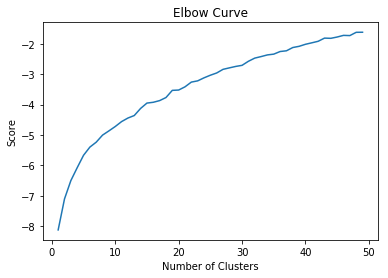

In [37]:
#To find the optimal number of clusters, there are many options (mostly subjective). One of these is the Elbow method, which I will use to get a sense of the number of clusters

Nc = range(1, 50)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(Cities_grouped_clustering).score(Cities_grouped_clustering) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [38]:
# set number of clusters
kclusters = 8

Cities_grouped_clustering = Cities_grouped.drop('Neighborhood', 1)
Cities_grouped_clustering.shape

(134, 191)

In [39]:
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=2).fit(Cities_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:135] 

array([4, 6, 2, 4, 2, 6, 2, 4, 1, 2, 2, 5, 5, 1, 7, 2, 2, 2, 6, 6, 6, 2,
       1, 1, 2, 5, 3, 6, 1, 2, 6, 2, 5, 2, 4, 1, 5, 2, 6, 5, 6, 5, 5, 3,
       0, 4, 1, 4, 5, 5, 2, 1, 1, 5, 3, 5, 5, 5, 2, 5, 5, 5, 1, 6, 6, 6,
       0, 2, 2, 0, 2, 2, 1, 0, 0, 5, 5, 1, 4, 2, 2, 6, 2, 6, 2, 0, 1, 5,
       2, 2, 0, 7, 6, 1, 2, 4, 7, 6, 5, 5, 1, 2, 2, 5, 2, 2, 2, 2, 5, 1,
       6, 2, 6, 0, 2, 3, 5, 2, 5, 5, 6, 0, 2, 6, 1, 5, 4, 2, 1, 0, 2, 2,
       5, 2], dtype=int32)

In [40]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_, allow_duplicates=True)

Cities_merged = Cities_df4

In [41]:
# merge Cities_grouped with Sorted Venues to add latitude/longitude for each neighborhood
Cities_merged = Cities_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='City/Town')

In [42]:
Cities_merged = Cities_merged.dropna() # clean up if there are any missing data
Cities_merged

,City/Town,Country/Territory,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Abidjan,Ivory Coast,5.320357,-4.016107,4.0,Hotel,Restaurant,Grocery Store,Convenience Store,Park
2,Abu Dhabi,United Arab Emirates,24.474796,54.370576,6.0,Restaurant,Fast Food,Hotel,Café,Movie Theater
4,Accra,Ghana,5.560014,-0.205744,2.0,Museum,Restaurant,Bar,Hotel,Department Store
9,Algiers,Algeria,36.775361,3.060188,4.0,Restaurant,Hotel,Museum,Historic Site,Harbor / Marina
12,Amsterdam,Netherlands,52.372760,4.893604,2.0,Restaurant,Bar,Hotel,Café,Dessert
13,The Hague,Netherlands,52.079984,4.311346,5.0,Restaurant,Café,Dessert,Fast Food,Bar
14,Andorra la Vella,Andorra,42.506939,1.521247,6.0,Restaurant,Bar,Sports Stadium,Hotel,Café
15,Ankara,Turkey,39.920777,32.854067,2.0,Café,Restaurant,Bar,Bookstore,Dessert
16,Antananarivo,Madagascar,-18.910012,47.525581,4.0,Restaurant,Hotel,Fast Food,Café,Dessert
17,Apia,Samoa,-13.834369,-171.769279,1.0,Restaurant,Department Store,Café,Fast Food,Bookstore


# Results

In [43]:
# create map with the clustered Neighborhoods
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=2)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Cities_merged['Latitude'], Cities_merged['Longitude'], Cities_merged['City/Town'], Cities_merged['Cluster Labels'].astype(int)):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [248]:
#Let's find the distances between the various clusters
from sklearn.metrics.pairwise import euclidean_distances

dists = euclidean_distances(kmeans.cluster_centers_)

dists_df= pd.DataFrame(dists)
dists_df.columns = ['Cluster 0', 'Cluster 1','Cluster 2', 'Cluster 3','Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']
test = dists_df.idxmax(axis=1, skipna=True)
cluster = ['Cluster 0', 'Cluster 1','Cluster 2', 'Cluster 3','Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']
dists_df['Cluster'] = cluster
dists_df = dists_df[['Cluster','Cluster 0', 'Cluster 1','Cluster 2', 'Cluster 3','Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']]
dists_df['Farthest Cluster'] = test
#test
dists_df

,Cluster,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Farthest Cluster
0,Cluster 0,0.000000,0.215141,0.218370,0.334098,0.246235,0.245508,0.352148,0.332582,Cluster 6
1,Cluster 1,0.215141,0.000000,0.197673,0.317625,0.329850,0.182355,0.291546,0.331368,Cluster 7
2,Cluster 2,0.218370,0.197673,0.000000,0.328033,0.291451,0.135959,0.199070,0.341552,Cluster 7
3,Cluster 3,0.334098,0.317625,0.328033,0.000000,0.436317,0.314146,0.396978,0.493168,Cluster 7
4,Cluster 4,0.246235,0.329850,0.291451,0.436317,0.000000,0.261084,0.314708,0.430721,Cluster 3
5,Cluster 5,0.245508,0.182355,0.135959,0.314146,0.261084,0.000000,0.133448,0.364551,Cluster 7
6,Cluster 6,0.352148,0.291546,0.199070,0.396978,0.314708,0.133448,0.000000,0.434889,Cluster 7
7,Cluster 7,0.332582,0.331368,0.341552,0.493168,0.430721,0.364551,0.434889,0.000000,Cluster 3


    Country/Territory
99           Zimbabwe
148           Lesotho
155           Uruguay
169     New Caledonia
170             Tonga
191        Cape Verde
198      Saudi Arabia
231        Uzbekistan
244     Liechtenstein
253     United States


index    Hotel, Restaurant, Café, Plaza
dtype: object

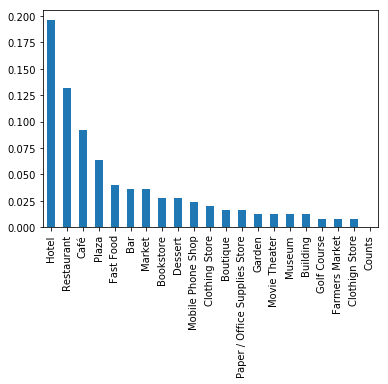

In [247]:
#Cluster 0 appears to be dominated by a combination of Hotels, Restaurants and Cafes
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 0, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C0=pd.DataFrame(Cities_hist['Country/Territory'])
Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C0)
Cities_counts0 = Cities_counts.reset_index()
Cities_cat0 = pd.DataFrame(Cities_counts0[:4]['index'])
Cities_cat0 = Cities_cat0.apply(', '.join)
Cities_cat0

                    Country/Territory
17                              Samoa
31              Saint Kitts and Nevis
42                       South Africa
49                           Barbados
50                            Belgium
56                          Venezuela
74                         East Timor
105                         Indonesia
118                           Jamaica
119                    Norfolk Island
120  Saint Vincent and the Grenadines
142                          Maldives
167                   Northern Cyprus
175                            Canada
203                        Costa Rica
213                         Singapore
225                          Abkhazia
248                        Seychelles
252                            Poland


index    Restaurant, Fast Food, Café, Dessert
dtype: object

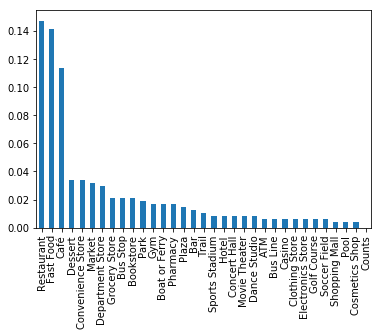

In [232]:
#Cluster 1 appears to be dominated by a combination of Fast Food, Restaurants, and Cafes
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 1, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C1=pd.DataFrame(Cities_hist['Country/Territory'])
Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C1)
Cities_counts1 = Cities_counts.reset_index()
Cities_cat1 = pd.DataFrame(Cities_counts1[:4]['index'])
Cities_cat1 = Cities_cat1.apply(', '.join)
Cities_cat1

    Country/Territory
4               Ghana
12        Netherlands
15             Turkey
20           Paraguay
21             Greece
33            Lebanon
34             Serbia
36            Germany
47           Slovakia
51            Romania
58         Montenegro
59         Montenegro
61            Moldova
66            Denmark
78            Ireland
115           Ukraine
135    United Kingdom
150            Mexico
151           Belarus
158              Oman
160           Bahamas
182            France
183      Sint Maarten
190    Czech Republic
196           Iceland
197            Latvia
204       Puerto Rico
214   North Macedonia
215          Bulgaria
217            Jersey
220          Guernsey
222  Falkland Islands
224            Sweden
228           Estonia
232           Georgia
237      Transnistria
245             Malta
251         Lithuania
254       New Zealand
256           Curaçao
261           Croatia


index    Restaurant, Bar, Café, Dessert
dtype: object

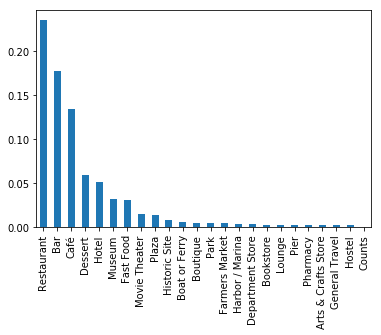

In [233]:
#Cluster 2 appears to be dominated by Restaurant, Bar, Cafe
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 2, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C2=pd.DataFrame(Cities_hist['Country/Territory'])
Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C2)
Cities_counts2 = Cities_counts.reset_index()
Cities_cat2 = pd.DataFrame(Cities_counts2[:4]['index'])
Cities_cat2 = Cities_cat2.apply(', '.join)
Cities_cat2

    Country/Territory
54              Egypt
98            Vietnam
124            Kuwait
234              Iran


index    Café, Restaurant, Fast Food, Dessert
dtype: object

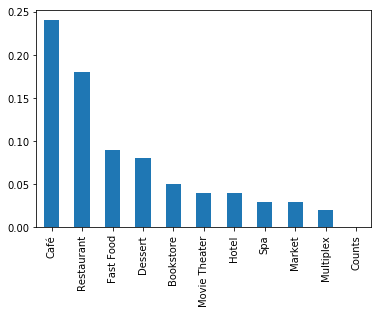

In [234]:
#Cluster 3 appears to be dominated by Restaurants,Cafes, Fast food, and Desserts
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 3, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C3=pd.DataFrame(Cities_hist['Country/Territory'])
Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C3)
Cities_counts3 = Cities_counts.reset_index()
Cities_cat3 = pd.DataFrame(Cities_counts3[:4]['index'])
Cities_cat3 = Cities_cat3.apply(', '.join)
Cities_cat3

    Country/Territory
0         Ivory Coast
9             Algeria
16         Madagascar
71           Tanzania
101              Cuba
112            Uganda
179            Panama
205        San Marino
250              Laos


index    Hotel, Restaurant, Dessert, Fast Food
dtype: object

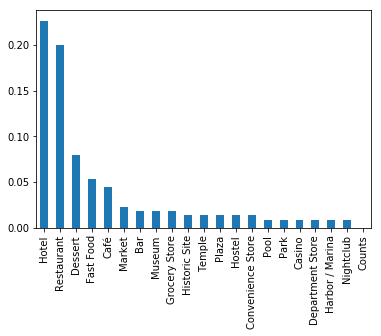

In [235]:
#Cluster 4 appears to be dominated by a Hotels, Restaurants, Desserts, Cafe. 
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 4, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C4=pd.DataFrame(Cities_hist['Country/Territory'])

Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C4)
Cities_counts4 = Cities_counts.reset_index()
Cities_cat4 = pd.DataFrame(Cities_counts4[:4]['index'])
Cities_cat4 = Cities_cat4.apply(', '.join)
Cities_cat4

      Country/Territory
13          Netherlands
25           Azerbaijan
27               Brunei
53            Argentina
63            Sri Lanka
76                Qatar
93            Guatemala
95                 Guam
97        Easter Island
113               Nepal
114               Sudan
122            Malaysia
125             Bolivia
126             Bolivia
129                Peru
130            Portugal
136              Angola
137              Zambia
139               Spain
171          Kazakhstan
174              Norway
194             Ecuador
209  Dominican Republic
212         South Korea
216             Grenada
238               Japan
239       Faroe Islands
249             Austria
260             Armenia


index    Restaurant, Café, Hotel, Fast Food
dtype: object

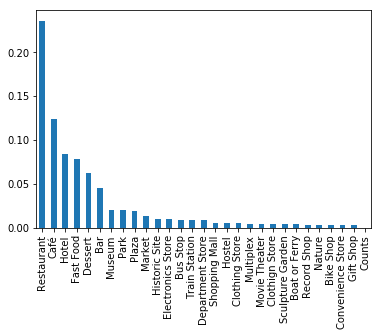

In [236]:
#Cluster 5 appears to be dominated by resturants, along with some markets, and different types of stores. Missing completely are bars and desserts
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 5, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C5=pd.DataFrame(Cities_hist['Country/Territory'])

Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C5)
Cities_counts5 = Cities_counts.reset_index()
Cities_cat5 = pd.DataFrame(Cities_counts5[:4]['index'])
Cities_cat5 = Cities_cat5.apply(', '.join)
Cities_cat5

                Country/Territory
2            United Arab Emirates
14                        Andorra
37                    Switzerland
38                     Kyrgyzstan
41                   South Africa
43                       Colombia
60   United States Virgin Islands
88                 Cayman Islands
94               Saint Barthélemy
143                     Nicaragua
144                       Bahrain
147                  Saint Martin
184                      Cambodia
189           Trinidad and Tobago
201                      Dominica
207                         Chile
208                         Chile
227                        Taiwan
229                     Hong Kong
243                      Mongolia


index    Restaurant, Café, Bar, Hotel
dtype: object

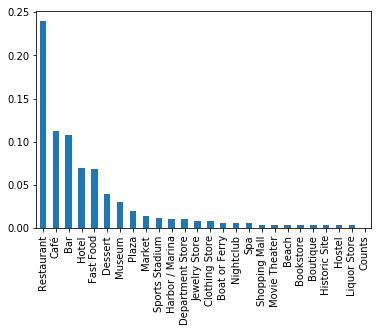

In [237]:
#Cluster 6 appears to be China, which is different from all the others. Seems it is dominated by more cultural aspects, including historic sites, museums, concert halls 
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 6, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C6=pd.DataFrame(Cities_hist['Country/Territory'])

Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)
Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C6)
Cities_counts6 = Cities_counts.reset_index()
Cities_cat6 = pd.DataFrame(Cities_counts6[:4]['index'])
Cities_cat6 = Cities_cat6.apply(', '.join)
Cities_cat6

    Country/Territory
32              China
200             Italy
206       El Salvador


index    Historic Site, Restaurant, Train Station, Plaza
dtype: object

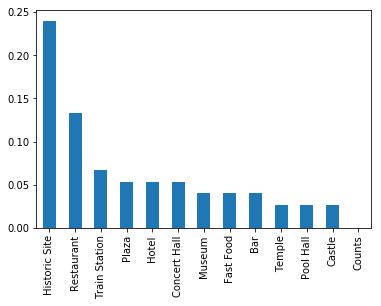

In [238]:
#Cluster 7 appears to be dominated by cafes firt, followed by restaurants
Cities_hist = Cities_merged.loc[Cities_merged['Cluster Labels'] == 7, Cities_merged.columns[[1] + list(range(5, Cities_merged.shape[1]))]]
Cities_C7=pd.DataFrame(Cities_hist['Country/Territory'])
Cities_cat = pd.DataFrame(columns = ['Categories'])
Cities_hist.drop(columns = ['Country/Territory'], inplace = True)
Cities_counts = pd.DataFrame(columns = ['Venue', 'Counts'])
for i in range(0,5):
    Cities_counts1 = Cities_hist.iloc[:,i].value_counts()*((6-i)/5)
    Cities_counts = Cities_counts.append(Cities_counts1)
Cities_counts = Cities_counts.drop(columns=['Venue'])
Cities_counts = Cities_counts.sum(axis=0).sort_values(ascending=False)

Cities_counts = Cities_counts/(5*Cities_hist.shape[0])
Cities_counts.plot(kind='bar')
print(Cities_C7)
Cities_counts7 = Cities_counts.reset_index()
Cities_cat7 = pd.DataFrame(Cities_counts7[:4]['index'])
Cities_cat7 = Cities_cat7.apply(', '.join)
Cities_cat7

In [249]:
#dists_df.drop(columns=['Country/Territory'], inplace=True)
X = pd.DataFrame([Cities_C0.apply(', '.join), Cities_C1.apply(', '.join),Cities_C2.apply(', '.join),Cities_C3.apply(', '.join), Cities_C4.apply(', '.join),Cities_C5.apply(', '.join), Cities_C6.apply(', '.join),Cities_C7.apply(', '.join)])
Y = pd.DataFrame([Cities_cat0, Cities_cat1, Cities_cat2, Cities_cat3, Cities_cat4, Cities_cat5, Cities_cat6, Cities_cat7])
dists_df = dists_df.join(X).join(Y)
dists_df = dists_df.rename(columns = {'index': 'Categories'})
dists_df

,Cluster,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Farthest Cluster,Country/Territory,Categories
0,Cluster 0,0.000000,0.215141,0.218370,0.334098,0.246235,0.245508,0.352148,0.332582,Cluster 6,"Zimbabwe, Lesotho, Uruguay, New Caledonia, Ton...","Hotel, Restaurant, Café, Plaza"
1,Cluster 1,0.215141,0.000000,0.197673,0.317625,0.329850,0.182355,0.291546,0.331368,Cluster 7,"Samoa, Saint Kitts and Nevis, South Africa, Ba...","Restaurant, Fast Food, Café, Dessert"
2,Cluster 2,0.218370,0.197673,0.000000,0.328033,0.291451,0.135959,0.199070,0.341552,Cluster 7,"Ghana, Netherlands, Turkey, Paraguay, Greece, ...","Restaurant, Bar, Café, Dessert"
3,Cluster 3,0.334098,0.317625,0.328033,0.000000,0.436317,0.314146,0.396978,0.493168,Cluster 7,"Egypt, Vietnam, Kuwait, Iran","Café, Restaurant, Fast Food, Dessert"
4,Cluster 4,0.246235,0.329850,0.291451,0.436317,0.000000,0.261084,0.314708,0.430721,Cluster 3,"Ivory Coast, Algeria, Madagascar, Tanzania, Cu...","Hotel, Restaurant, Dessert, Fast Food"
5,Cluster 5,0.245508,0.182355,0.135959,0.314146,0.261084,0.000000,0.133448,0.364551,Cluster 7,"Netherlands, Azerbaijan, Brunei, Argentina, Sr...","Restaurant, Café, Hotel, Fast Food"
6,Cluster 6,0.352148,0.291546,0.199070,0.396978,0.314708,0.133448,0.000000,0.434889,Cluster 7,"United Arab Emirates, Andorra, Switzerland, Ky...","Restaurant, Café, Bar, Hotel"
7,Cluster 7,0.332582,0.331368,0.341552,0.493168,0.430721,0.364551,0.434889,0.000000,Cluster 3,"China, Italy, El Salvador","Historic Site, Restaurant, Train Station, Plaza"


# Discussion

The final table comprises of a few important results:
1. The countries in each of the clusters.
2. The 4 biggest categories in each of the clusters.
3. The Euclidean distance between the various clusters. 
    a. At a glance, this should help to see how similar or different the other clusters are
    b. If we want to go to similar to place, we simply look for other countries in the same cluster.
    b. If we want to do something entirely new, we would look for the largest distance. For example, cluster 5 contains places with restaurants, cafes, hotels, and fast food shops. Cluster 7, with a focus on historis sites, and train based travel, appears to be the most different from cluster 5.
    
Clearly, there are certain aspects that were not well resolved in this. 
1. The dominant categories of foods and hotels far outweigh some of the other important attractions in each venue. If I wanted to visit a scenic place, the algorithm does not cover. However, such a thing can be easily searched from the main dataframe (cities_grouped)
2. In addition, we had to discard a significant number of cities simply because there wasn't enough variety of venues. For example, some of the biggest countries, India and Australia, are not included in the map.
3. As we said before, it is important to recognize that this work involved only the capital cities (typically a spot for governmental activities), so a lot might be missing with regards to the culture, nature.

# Conclusion

A simple map comprising the various clusters around the world was successfully generated. Kmeans was used to cluster over a 100 cities around the world. And a highly useful starting point was generated in the form of the final table. Yet, more sophistication could yield significantly better insights and recommendations of places. 

As a next, we could add more cities around the world. We could filter some of the more common categories out to reveal a deeper look at the venues. In other words, if we remove the categories of restaurants, cafes, and desserts, how would this look. Perhaps, the categories can be more thoroughly cleaned up and contain multilevel indices t